In [2]:
# import the libraries top use
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 

sns.set_theme()

# Step 1: Problem statement and data collection

We can see the data information in the page <https://insideairbnb.com/new-york-city/> where each feature is:

- age. Age of customer (numeric)
- job. Type of job (categorical)
- marital. Marital status (categorical)
- education. Level of education (categorical)
- default. Do you currently have credit (categorical)
- housing. Do you have a housing loan (categorical)
- loan. Do you have a personal loan? (categorical)
- contact. Type of contact communication (categorical)
- month. Last month in which you have been contacted (categorical)
- day_of_week. Last day on which you have been contacted (categorical)
- duration. Duration of previous contact in seconds (numeric)
- campaign. Number of contacts made during this campaign to the customer (numeric)
- pdays. Number of days that elapsed since the last campaign until the customer was contacted (numeric)
- previous. Number of contacts made during the previous campaign to the customer (numeric)
- poutcome. Result of the previous marketing campaign (categorical)
- emp.var.rate. Employment variation rate. Quarterly indicator (numeric)
- cons.price.idx. Consumer price index. Monthly indicator (numeric)
- cons.conf.idx. Consumer confidence index. Monthly indicator (numeric)
- euribor3m. EURIBOR 3-month rate. Daily indicator (numeric)
- nr.employed. Number of employees. Quarterly indicator (numeric)
- y. TARGET. Whether the customer takes out a long-term deposit or not (categorical)

In [3]:
from utils import load_data, ReadCsvParams, SaveCsvParams

file_path = '../data/raw/bank-marketing-campaign-data.csv'
url = 'https://raw.githubusercontent.com/4GeeksAcademy/logistic-regression-project-tutorial/main/bank-marketing-campaign-data.csv'
read_csv_params: ReadCsvParams = {'delimiter': ';'}
save_csv_params: SaveCsvParams = {'sep': ';'}

df: pd.DataFrame = load_data(file_path=file_path, url=url, read_csv_params=read_csv_params, save_csv_params=save_csv_params)

Loading data from file: ../data/raw/bank-marketing-campaign-data.csv


## Problem to solve:

We want to create a logistic classifier using the collected data to see if a person can take a long-term deposit or not.

# Step 2: Exploration and data cleaning

Lets see the head of the data

In [4]:
# head of the data
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
# info of the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [6]:
# describe the data
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [7]:
# numerical columns
numerical_cols: list[str] = ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

# categorical columns
categorical_cols: list[str] = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']

# target variable
target: str = 'y'

## Eliminate duplicates

We do not have a feature to verify if there are some duplicate values, so we are not going to test this.

## Eliminate irrelevant information

We are going to do this step after some of the analysis.

# Step 3: Analysis of univariate variables

A **univariate variable** is a statistical term used to refer to a set of observations of an attribute. That is, the column-by-column analysis of the DataFrame. To do this, we must distinguish whether a variable is categorical or numerical, as the body of the analysis and the conclusions that can be drawn will be different.

## Analysis of categorical variables

A **categorical variable** is a type of variable that can be one of a limited number of categories or groups. These groups are often nominal (e.g., the color of a car: red, blue, black, etc., but none of these colors is inherently "greater" or "better" than the others) but can also be represented by finite numbers.

**To represent these types of variables we will use histograms.**

In [8]:
# lets remember the categorical data
print(f'Categorical columns: {categorical_cols}')
print(f'Amount of categorical columns: {len(categorical_cols)}')

Categorical columns: ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']
Amount of categorical columns: 11


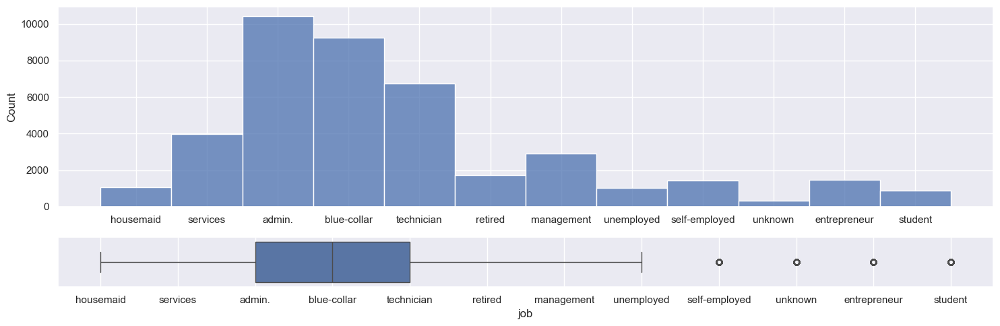

In [9]:
fig, axis = plt.subplots(2, 1, figsize = (15, 5), gridspec_kw={'height_ratios': [4, 1]})

# creating a multiple figure with histograms and box plots
# 	first col
sns.histplot(ax = axis[0], data = df, x = "job").set(xlabel = None)
sns.boxplot(ax = axis[1], data = df, x = "job")

# adjust the layout
plt.tight_layout()

# show the plot
plt.show()

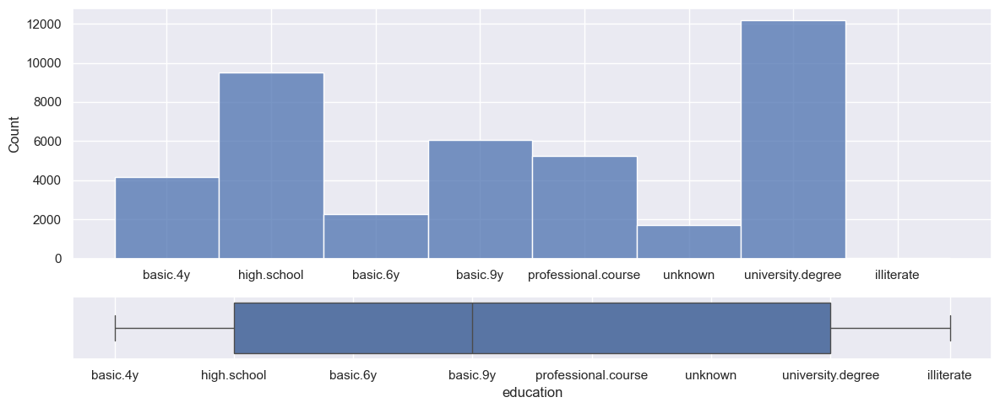

In [10]:
fig, axis = plt.subplots(2, 1, figsize = (12, 5), gridspec_kw={'height_ratios': [4, 1]})

# creating a multiple figure with histograms and box plots
# 	first col
sns.histplot(ax = axis[0], data = df, x = "education").set(xlabel = None)
sns.boxplot(ax = axis[1], data = df, x = "education")

# adjust the layout
plt.tight_layout()

# show the plot
plt.show()

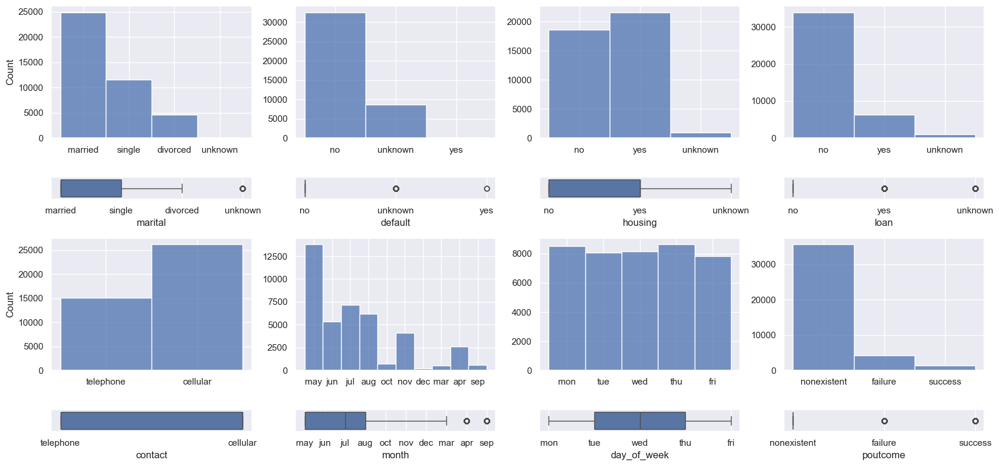

In [11]:
fig, axis = plt.subplots(4, 4, figsize = (17, 8), gridspec_kw={'height_ratios': [6, 1, 6, 1]})

# creating a multiple figure with histograms and box plots
# first row
# 	first col
sns.histplot(ax = axis[0, 0], data = df, x = "marital").set(xlabel = None)
sns.boxplot(ax = axis[1, 0], data = df, x = "marital")
# 	second col
sns.histplot(ax = axis[0, 1], data = df, x = "default").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 1], data = df, x = "default")
# 	third col
sns.histplot(ax = axis[0, 2], data = df, x = "housing").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 2], data = df, x = "housing")
# 	four col
sns.histplot(ax = axis[0, 3], data = df, x = "loan").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 3], data = df, x = "loan")

# second row
# 	first col
sns.histplot(ax = axis[2, 0], data = df, x = "contact").set(xlabel = None)
sns.boxplot(ax = axis[3, 0], data = df, x = "contact")
# 	second col
sns.histplot(ax = axis[2, 1], data = df, x = "month").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[3, 1], data = df, x = "month")
# 	third col
sns.histplot(ax = axis[2, 2], data = df, x = "day_of_week").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[3, 2], data = df, x = "day_of_week")
# 	four col
sns.histplot(ax = axis[2, 3], data = df, x = "poutcome").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[3, 3], data = df, x = "poutcome")


# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

Now the target variable histplot

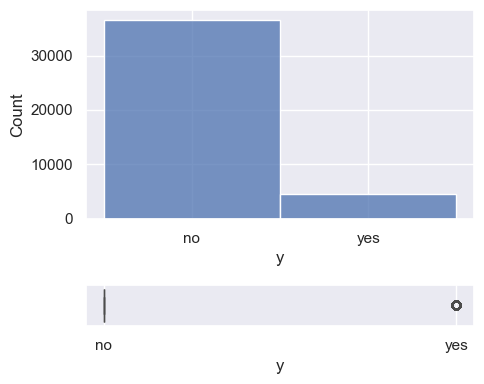

In [12]:
fig, axis = plt.subplots(2, 1, figsize = (5, 4), gridspec_kw={'height_ratios': [5, 1]})

# creating a multiple figure with histograms and box plots
# 	first col
sns.histplot(ax = axis[0], data = df, x = "y")
sns.boxplot(ax = axis[1], data = df, x = "y")

# adjust the layout
plt.tight_layout()

# show the plot
plt.show()

We can see the data is bias to the **no** label, this is going to affect the constructed model.

## Analysis on numeric variables

A **numeric variable** is a type of variable that can take numeric values (integers, fractions, decimals, negatives, etc.) in an infinite range. A numerical categorical variable can also be a numerical variable. 

**They are usually represented using a histogram and a boxplot, displayed together.**

In [13]:
# lets remember the categorical data
print(f'Categorical columns: {numerical_cols}')
print(f'Amount of categorical columns: {len(numerical_cols)}')

Categorical columns: ['age', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
Amount of categorical columns: 10


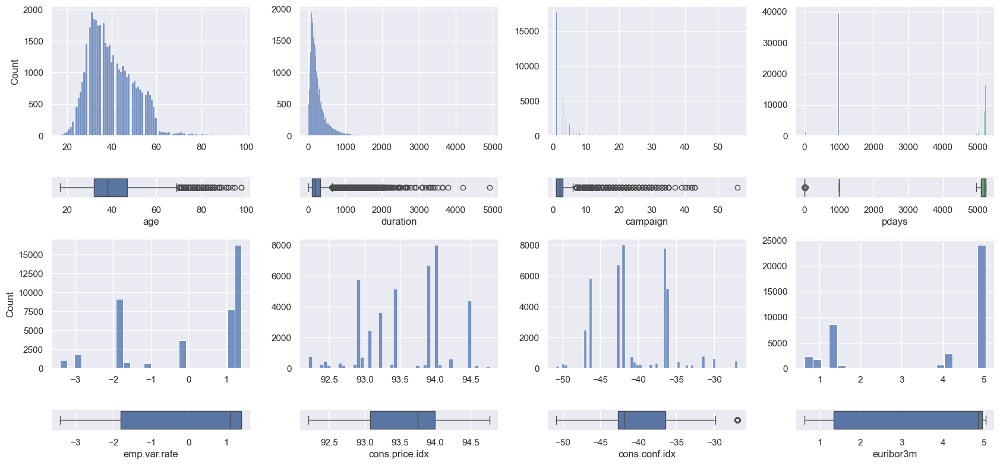

In [14]:
fig, axis = plt.subplots(4, 4, figsize = (17, 8), gridspec_kw={'height_ratios': [6, 1, 6, 1]})

# creating a multiple figure with histograms and box plots
# first row
# 	first col
sns.histplot(ax = axis[0, 0], data = df, x = "age").set(xlabel = None)
sns.boxplot(ax = axis[1, 0], data = df, x = "age")
# 	second col
sns.histplot(ax = axis[0, 1], data = df, x = "duration").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 1], data = df, x = "duration")
# 	third col
sns.histplot(ax = axis[0, 2], data = df, x = "campaign").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 2], data = df, x = "campaign")
# 	four col
sns.histplot(ax = axis[0, 3], data = df, x = "pdays").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 3], data = df, x = "pdays")
# 	fifth col
sns.histplot(ax = axis[0, 3], data = df, x = "previous").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 3], data = df, x = "previous")

# second row
# 	first col
sns.histplot(ax = axis[2, 0], data = df, x = "emp.var.rate").set(xlabel = None)
sns.boxplot(ax = axis[3, 0], data = df, x = "emp.var.rate")
# 	second col
sns.histplot(ax = axis[2, 1], data = df, x = "cons.price.idx").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[3, 1], data = df, x = "cons.price.idx")
# 	third col
sns.histplot(ax = axis[2, 2], data = df, x = "cons.conf.idx").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[3, 2], data = df, x = "cons.conf.idx")
# 	four col
sns.histplot(ax = axis[2, 3], data = df, x = "euribor3m").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[3, 3], data = df, x = "euribor3m")
# 	fifth col
sns.histplot(ax = axis[0, 3], data = df, x = "nr.employed").set(xlabel = None, ylabel = None)
sns.boxplot(ax = axis[1, 3], data = df, x = "nr.employed")

# adjust the layout
plt.tight_layout()

# show the plot
plt.show()

# Step 4: Analysis of multivariate variables

After analyzing the characteristics one by one, it is time to analyze them in relation to the predictor and to themselves, in order to draw clearer conclusions about their relationships and to be able to make decisions about their processing.

Thus, if we would like to eliminate a variable due to a high amount of null values or certain outliers, it is necessary to first apply this process to ensure that the elimination of certain values are not critical for the survival of a passenger. For example, the variable Cabin has many null values, and we would have to ensure that there is no relationship between it and survival before eliminating it, since it could be very significant and important for the model and its presence could bias the prediction.

## Numerical-numerical analysis

When the two variables being compared have numerical data, the analysis is said to be numerical-numerical. 

**Scatterplots and correlation analysis are used to compare two numerical columns.**

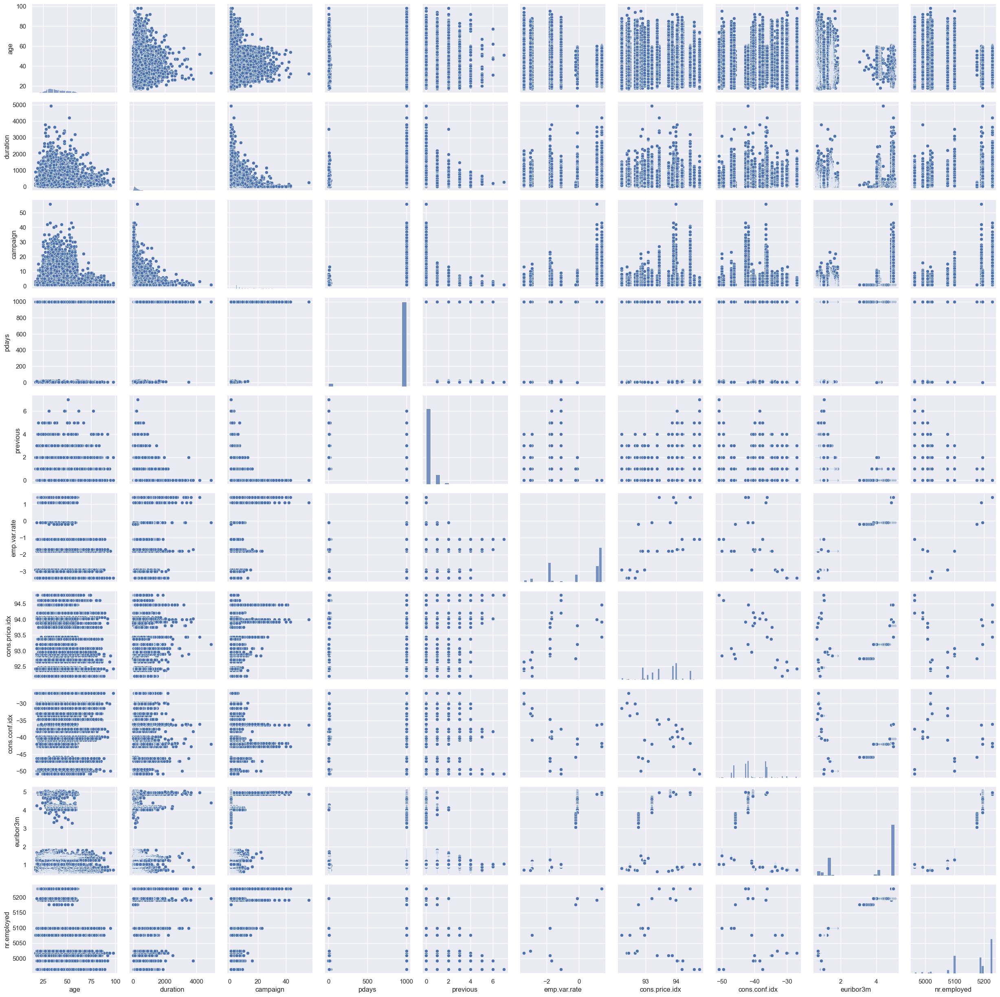

In [15]:
# graphs of numerical vs numerical with histograms and scatter plots
g = sns.PairGrid(df[numerical_cols])
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

Now lets create the corr matrix

<Axes: >

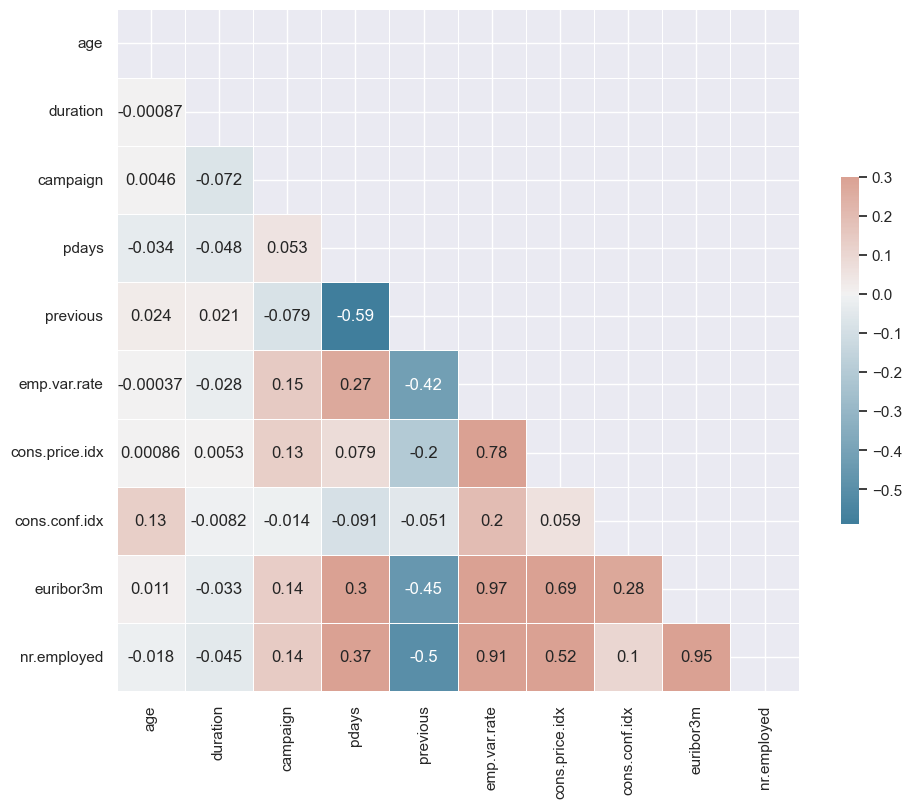

In [16]:
# compute the correlation matrix of the numerical columns
corr = df[numerical_cols].corr()

# generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
	corr, 
	annot=True,
	mask=mask, 
	cmap=cmap, 
	vmax=.3, 
	center=0,
	square=True, 
	linewidths=.5,
	cbar_kws={"shrink": .5}
)

We can see there are quite a few relationships with strong positive correlations and strong negative correlations.

## Categorical-categorical analysis

When the two variables being compared have categorical data, the analysis is said to be categorical-categorical. 

**Histograms and combinations are used to compare two categorical columns.**

In [17]:
# get a copy of the dataframe with factorize categorical data
fact_df = df.copy()

# factorize every categorical column unless the target
for col in categorical_cols:
	fact_df[col] = pd.factorize(fact_df[col])[0]

In [18]:
# see the factorize data
fact_df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,0,0,0,0,0,0,0,0,0,...,1,999,0,0,1.1,93.994,-36.4,4.857,5191.0,0
1,57,1,0,1,1,0,0,0,0,0,...,1,999,0,0,1.1,93.994,-36.4,4.857,5191.0,0
2,37,1,0,1,0,1,0,0,0,0,...,1,999,0,0,1.1,93.994,-36.4,4.857,5191.0,0
3,40,2,0,2,0,0,0,0,0,0,...,1,999,0,0,1.1,93.994,-36.4,4.857,5191.0,0
4,56,1,0,1,0,0,1,0,0,0,...,1,999,0,0,1.1,93.994,-36.4,4.857,5191.0,0


### Combinations of class with various predictors

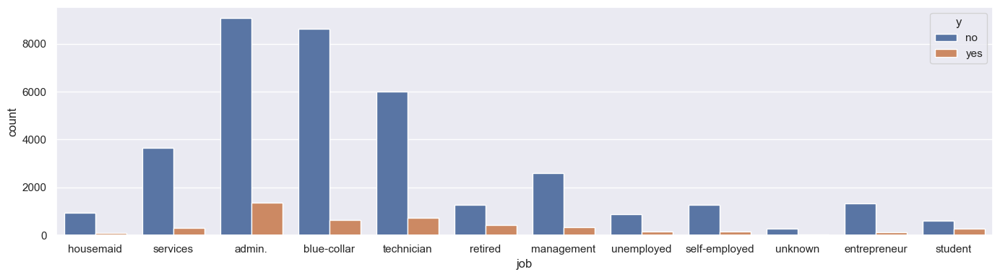

In [19]:
fig, axis = plt.subplots(figsize = (14, 4))

# countplot
sns.countplot(data = df, x = "job", hue="y")

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

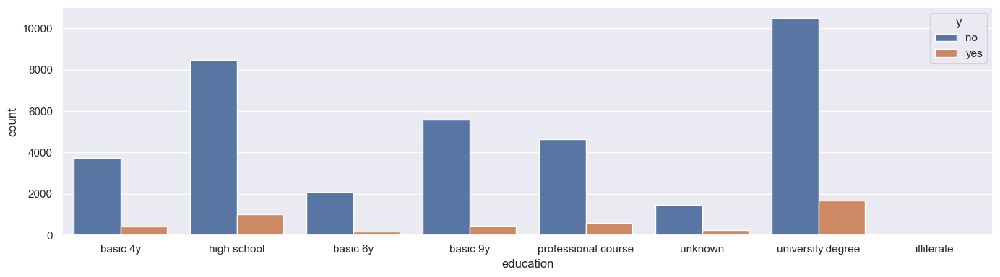

In [20]:
fig, axis = plt.subplots(figsize = (14, 4))

# countplot
sns.countplot(data = df, x = "education", hue="y")

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

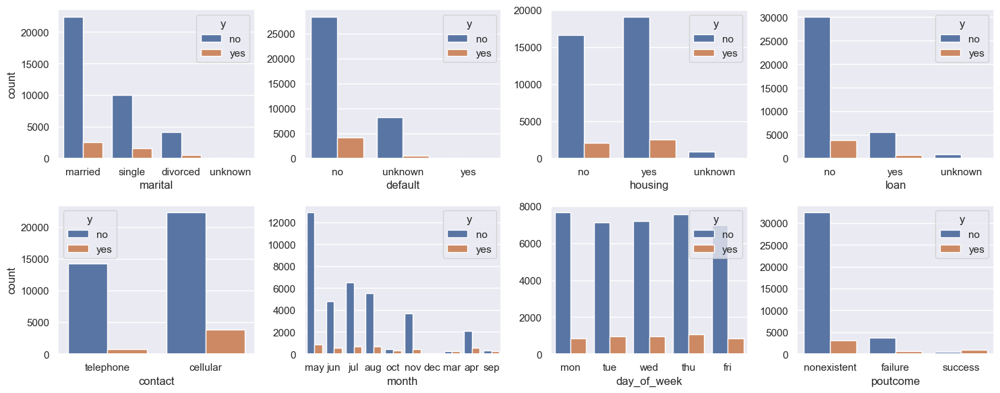

In [21]:
fig, axis = plt.subplots(2, 4, figsize = (15, 6))

# creating a multiple figure with count plots
# first row
# 	first col
sns.countplot(ax = axis[0, 0], data = df, x = "marital", hue="y")
# 	second col
sns.countplot(ax = axis[0, 1], data = df, x = "default", hue="y").set(ylabel = None)
# 	third col
sns.countplot(ax = axis[0, 2], data = df, x = "housing", hue="y").set(ylabel = None)
# 	four col
sns.countplot(ax = axis[0, 3], data = df, x = "loan", hue="y").set(ylabel = None)

# second row
# 	first col
sns.countplot(ax = axis[1, 0], data = df, x = "contact", hue="y")
# 	second col
sns.countplot(ax = axis[1, 1], data = df, x = "month", hue="y").set(ylabel = None)
# 	third col
sns.countplot(ax = axis[1, 2], data = df, x = "day_of_week", hue="y").set(ylabel = None)
# 	four col
sns.countplot(ax = axis[1, 3], data = df, x = "poutcome", hue="y").set(ylabel = None)


# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()

<Axes: >

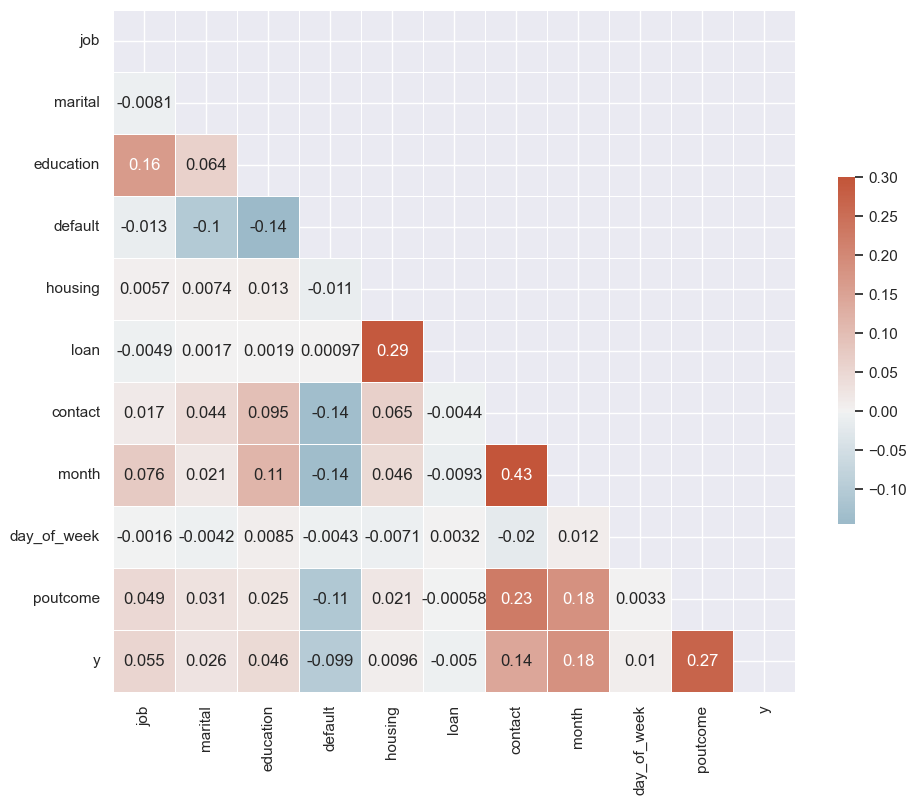

In [22]:
# compute the correlation matrix of the numerical columns
corr = fact_df[categorical_cols].corr()

# generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
	corr, 
	annot=True,
	mask=mask, 
	cmap=cmap, 
	vmax=.3, 
	center=0,
	square=True, 
	linewidths=.5,
	cbar_kws={"shrink": .5}
)

We can see some values with a positive correlation but not as strong as we saw in the numerical columns.

## Numerical-categorical analysis (complete)

<Axes: >

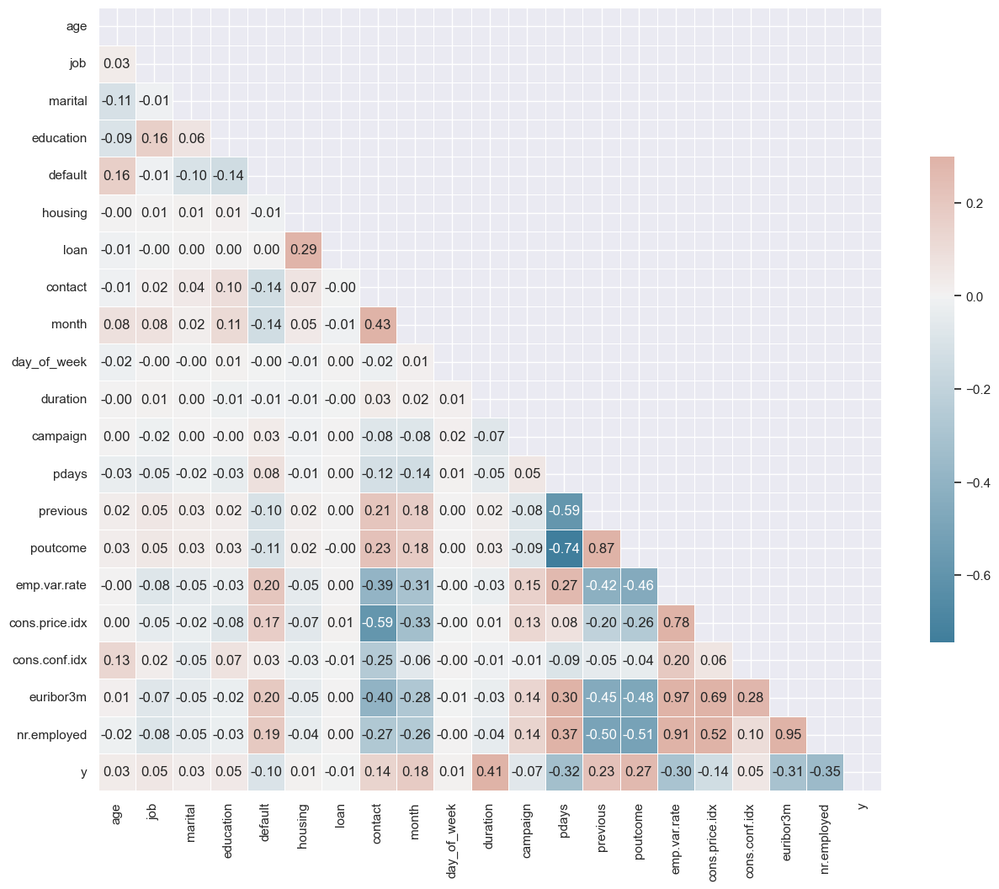

In [23]:
# compute the correlation matrix of all the data
corr = fact_df.corr()

# generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))

# generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
	corr, 
	annot=True,
	mask=mask, 
	cmap=cmap, 
	fmt=".2f",
	vmax=.3, 
	center=0,
	square=True, 
	linewidths=.5,
	cbar_kws={"shrink": .5},
)

We can see that the variables that have the stronger correlation with the target **y** are:

Positive correlation:
- duration
- poutcome
- previous

Negative correlation:
- nr.employed
- pdays
- emp.var.rate

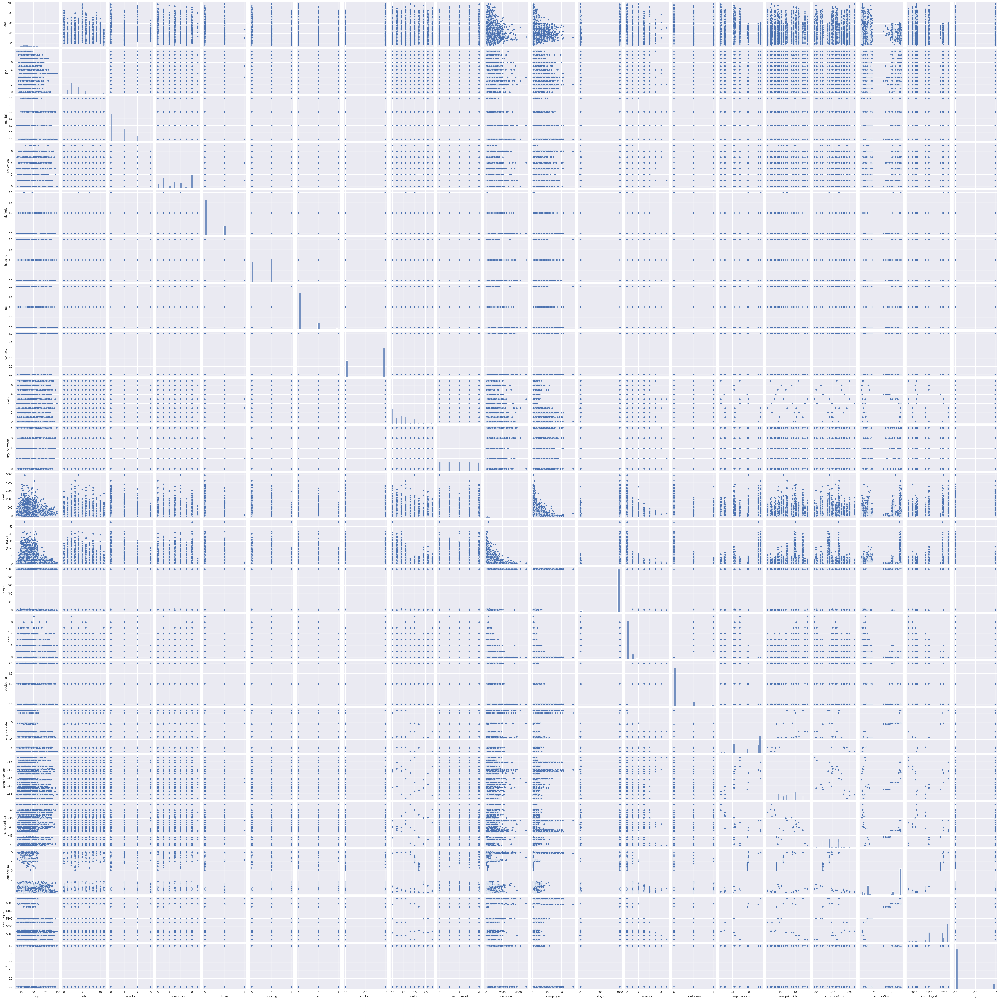

In [24]:
# pairplot of all the data
sns.pairplot(data = fact_df)

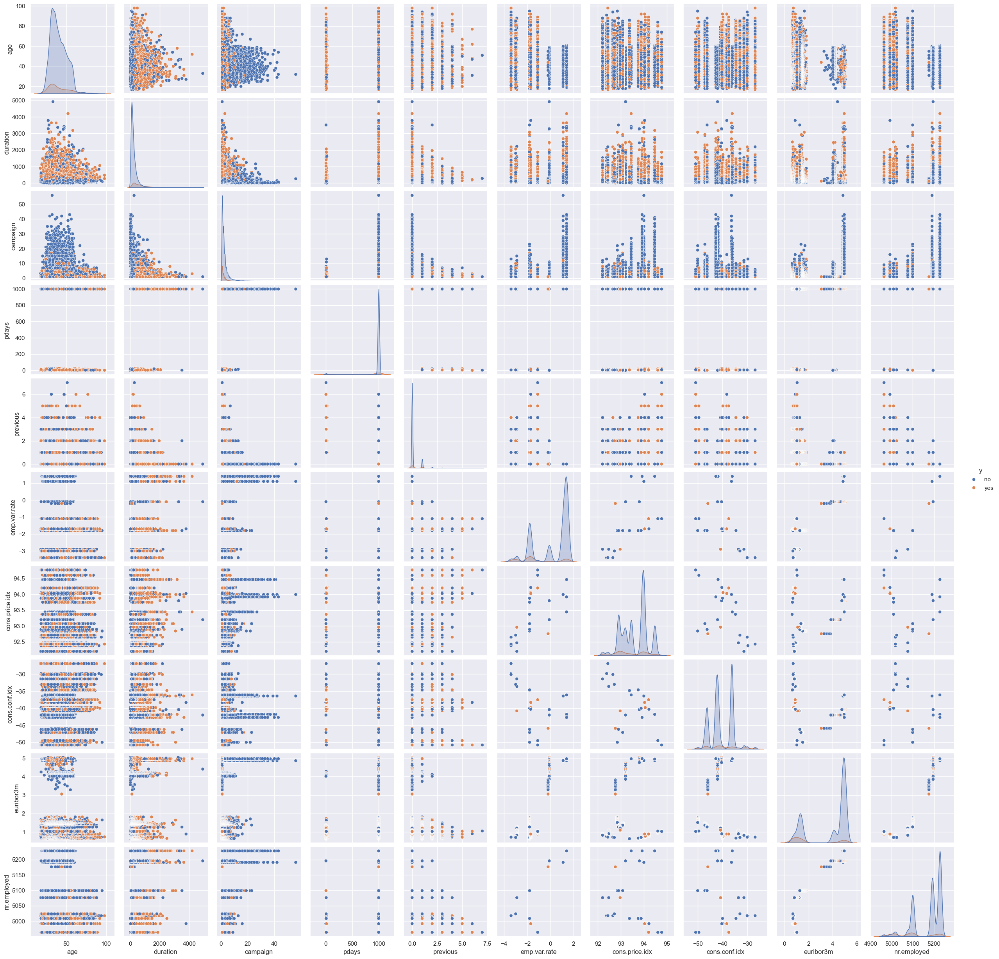

In [25]:
# graphs of numerical vs numerical with histograms and scatter plots and hue based on the target feature
sns.pairplot(data=df[numerical_cols + ['y']], hue='y')

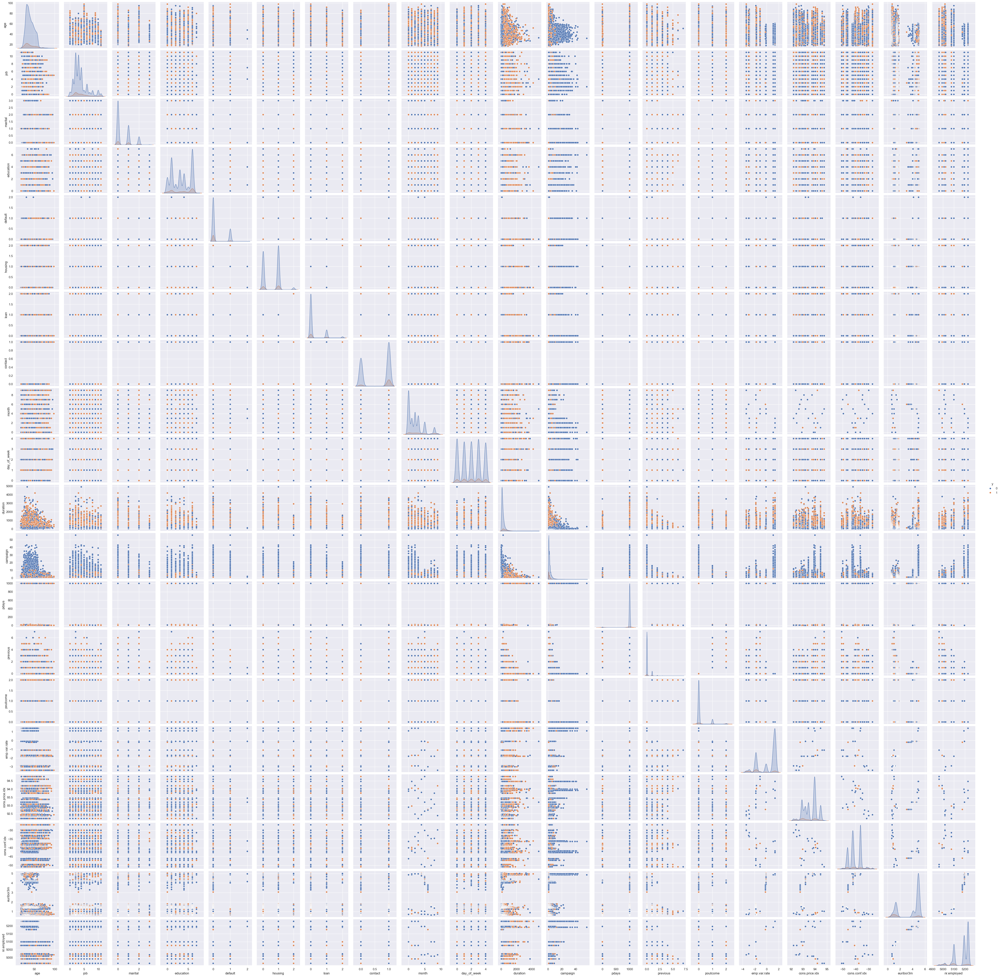

In [26]:
# pairplot of all the data with hue
sns.pairplot(data = fact_df, hue='y')

# Step 5: Feature engineering

Feature engineering is a process that involves the creation of new features (or variables) from existing ones to improve model performance. This may involve a variety of techniques, such as normalization, data transformation, and so on. The goal is to improve the accuracy of the model and/or reduce the complexity of the model, thus making it easier to interpret.

Although this could have been done in this step as it is part of the feature engineering, it is usually done before analyzing the variables, separating this process into a previous one and the one we are going to see next.

## Outlier analysis

An outlier is a data point that deviates significantly from the others. It is a value that is noticeably different from what would be expected given the general trend of the data. These outliers may be caused by errors in data collection, natural variations in the data, or they may be indicative of something significant, such as an anomaly or extraordinary event.

Descriptive analysis is a powerful tool for characterizing the data set: the mean, variance and quartiles provide powerful information about each variable. The describe() function of a DataFrame helps us to calculate in a very short time all these values.

In [27]:
# verify the distribution again, we are not going to work in the outliers this time
fact_df.describe()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,...,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,3.673691,0.510634,3.277532,0.208872,0.571914,0.199767,0.634748,2.250097,1.979581,...,2.567593,962.475454,0.172963,0.169904,0.081886,93.575664,-40.502600,3.621291,5167.035911,0.112654
std,10.42125,2.454116,0.696779,2.185525,0.406686,0.541209,0.456002,0.481507,2.429079,1.411514,...,2.770014,186.910907,0.494901,0.455754,1.570960,0.578840,4.628198,1.734447,72.251528,0.316173
min,17.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000,0.000000
25%,32.00000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,1.000000,999.000000,0.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000,0.000000
50%,38.00000,3.000000,0.000000,3.000000,0.000000,1.000000,0.000000,1.000000,2.000000,2.000000,...,2.000000,999.000000,0.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000,0.000000
75%,47.00000,4.000000,1.000000,6.000000,0.000000,1.000000,0.000000,1.000000,3.000000,3.000000,...,3.000000,999.000000,0.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000,0.000000
max,98.00000,11.000000,3.000000,7.000000,2.000000,2.000000,2.000000,1.000000,9.000000,4.000000,...,56.000000,999.000000,7.000000,2.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000,1.000000


## Missing value analysis

A **missing** value is a space that has no value assigned to it in the observation of a specific variable. These types of values are quite common and can arise for many reasons. For example, there could be an error in data collection, someone may have refused to answer a question in a survey, or it could simply be that certain information is not available or not applicable.

In [28]:
# verify non values
fact_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  int64  
 2   marital         41188 non-null  int64  
 3   education       41188 non-null  int64  
 4   default         41188 non-null  int64  
 5   housing         41188 non-null  int64  
 6   loan            41188 non-null  int64  
 7   contact         41188 non-null  int64  
 8   month           41188 non-null  int64  
 9   day_of_week     41188 non-null  int64  
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  int64  
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

**Now null values so no more work should be done**

## Inference of new features

Another typical use of this engineering is to obtain new features by "merging" two or more existing ones.

**We are not creating new features in this exercise**

## Divide the set into train and test,

In [29]:
from utils import split_my_data


# set independent and dependent variables
X: pd.DataFrame = fact_df.drop("y", axis = 1)
y: pd.Series = fact_df["y"]

# divide the dataset into training and test samples
X_train, X_test, y_train, y_test = split_my_data(X, y, test_size = 0.2, random_state = 42)

## Feature scaling

**Feature scaling** is a crucial step in data preprocessing for many Machine Learning algorithms. It is a technique that changes the range of data values so that they can be compared to each other.

### Feature Scaling with Scikit-learn (sklearn)

Scikit-learn (sklearn) provides several tools for feature scaling, each with its own characteristics and use cases. Here's a breakdown:

**1. StandardScaler:**

* **How it works:** Standardizes features by removing the mean and scaling to unit variance.
* **Formula:** `z = (x - u) / s`, where `u` is the mean and `s` is the standard deviation.
* **When to use:**
    * When your data has a Gaussian (normal) distribution or you want to transform it to resemble a Gaussian distribution.
    * When your model assumes that features are centered around zero and have unit variance (e.g., linear regression, logistic regression, support vector machines).
* **Caution:** Sensitive to outliers.

**2. MinMaxScaler:**

* **How it works:** Scales features to a given range, usually between 0 and 1.
* **Formula:** `x_scaled = (x - x_min) / (x_max - x_min)`
* **When to use:**
    * When you need to keep the values within a specific range.
    * When you don't have many outliers.
    * When using algorithms that are sensitive to the magnitude of features (e.g., neural networks).
* **Caution:** Sensitive to outliers.

**3. RobustScaler:**

* **How it works:** Scales features using statistics that are robust to outliers (median and interquartile range).
* **Formula:** `x_scaled = (x - median) / IQR`, where `IQR` is the interquartile range.
* **When to use:**
    * When your data contains outliers.
    * When you want to reduce the impact of outliers on your scaling.
* **Caution:** Doesn't normalize data to a specific range.

**4. MaxAbsScaler:**

* **How it works:** Scales features by dividing each value by the maximum absolute value.
* **Formula:** `x_scaled = x / abs(x_max)`
* **When to use:**
    * When you have sparse data (data with many zero values).
    * When you want to preserve the sparsity of your data.
    * When you want to scale data to the range [-1, 1].
* **Caution:** Sensitive to outliers in the maximum absolute values.

**5. QuantileTransformer:**

* **How it works:** Transforms features to follow a uniform or normal distribution. It is a non-linear transformation.
* **When to use:**
    * When your data has a non-linear distribution.
    * When you want to reduce the impact of outliers.
    * Can also compress outliers into a smaller interval.
* **Caution:** Distorts correlations and distances.

**6. PowerTransformer:**

* **How it works:** Applies power transformations (Yeo-Johnson or Box-Cox) to make data more Gaussian-like.
* **When to use:**
    * When your data is skewed and you want to normalize its distribution.
    * When your model assumes a Gaussian distribution.
* **Caution:** Works better for positive data. Box-Cox can only be used with strictly positive data.

**Key Considerations:**

* **Model Requirements:** The choice of scaler often depends on the requirements of your machine learning model. Some models are more sensitive to the scale of features than others.
* **Data Distribution:** Consider the distribution of your data (e.g., Gaussian, skewed, presence of outliers) when choosing a scaler.
* **Outliers:** If your data contains outliers, `RobustScaler` or `QuantileTransformer` are good choices.
* **Range Requirements:** If you need to scale data to a specific range (e.g., [0, 1] or [-1, 1]), use `MinMaxScaler` or `MaxAbsScaler`.
* **Pipelines and ColumnTransformer:** It is highly recommended to use the scikit-learn pipeline, and the ColumnTransformer to properly work with data that have different kind of data into it.

**In this case we are going to use a RobustScaler because we have a lot of outliers in the numerical data**. The target should not be scaled.

In [30]:
from sklearn.preprocessing import RobustScaler

# scaler instance
scaler = RobustScaler()

### scaling training data --------------------------

# crate a copy of the train dataframe
X_train_scaled: pd.DataFrame = X_train.copy()
# scale just the numerical columns
X_train_scaled[numerical_cols] = scaler.fit_transform(X_train_scaled[numerical_cols])

### scaling testing data --------------------------

# crate a copy of the test dataframe
X_test_scaled: pd.DataFrame = X_test.copy()
# scale just the numerical columns
X_test_scaled[numerical_cols] = scaler.fit_transform(X_test_scaled[numerical_cols])

Verify the scaling of the data

In [31]:
X_train_scaled.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
12556,0.133333,3,0,3,1,1,0,0,2,0,-0.393519,0.0,0.0,0.0,0,0.09375,0.183896,-0.142857,0.028477,0.287597
35451,-0.466667,2,0,6,0,0,0,1,0,0,-0.291667,1.0,0.0,0.0,0,-0.90625,-0.931447,-0.698413,-0.998894,-0.712403
30592,1.400000,5,0,0,0,0,0,1,0,0,-0.768519,2.0,0.0,1.0,1,-0.90625,-0.931447,-0.698413,-0.968482,-0.712403
17914,0.333333,0,2,3,0,1,0,1,2,1,-0.393519,1.5,0.0,0.0,0,0.09375,0.183896,-0.142857,0.028753,0.287597
3315,0.066667,2,1,1,1,0,0,0,0,3,0.763889,0.0,0.0,0.0,0,0.00000,0.266594,0.857143,0.000829,0.000000


In [32]:
X_test_scaled.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
32884,1.266667,4,0,1,0,0,1,1,0,0,0.859729,-0.5,0.0,1.0,1,-0.90625,-0.931447,-0.698413,-0.983688,-0.712403
3169,1.133333,9,0,5,1,1,0,0,0,3,0.470588,0.0,0.0,0.0,0,0.00000,0.266594,0.857143,0.000829,0.000000
32206,-0.333333,3,0,3,0,0,0,1,0,4,-0.583710,-0.5,0.0,1.0,1,-0.90625,-0.931447,-0.698413,-0.979818,-0.712403
9403,-0.133333,2,0,1,0,0,0,0,1,4,0.787330,1.0,0.0,0.0,0,0.09375,0.779108,0.000000,0.030412,0.287597
14020,-0.733333,0,0,1,0,1,0,1,2,4,0.036199,0.0,0.0,0.0,0,0.09375,0.183896,-0.142857,0.029306,0.287597


# Step 6: Feature selection

The feature selection is a process that involves selecting the most relevant features (variables) from our dataset to use in building a Machine Learning model, discarding the rest.

There are several reasons to include it in our exploratory analysis:

1. To simplify the model so that it is easier to understand and interpret.
2. To reduce the training time of the model.
3. Avoid overfitting by reducing the dimensionality of the model and minimizing noise and unnecessary correlations.
4. Improve model performance by removing irrelevant features.
 
In addition, there are several techniques for feature selection. Many of them are based on trained supervised or clustering models. More information is available here.

The sklearn library contains many of the best alternatives to perform it. One of the most commonly used tools for fast and successful feature selection processes is SelectKBest. This function selects the k best features from our dataset based on a function of a statistical test. This statistical test is usually an ANOVA or a Chi-Square.

In [33]:
from sklearn.feature_selection import SelectKBest

# create the selection model with the default values
selection_model = SelectKBest()
# fit the model to the train scaled data
selection_model.fit(X_train_scaled, y_train)
# get the indexes of the selected columns
ix = selection_model.get_support()

# get the dataframe of the train selected columns
X_train_sel = pd.DataFrame(selection_model.transform(X_train_scaled), columns = X_train_scaled.columns.values[ix]) # type: ignore

# get the dataframe of the test selected columns
X_test_sel = pd.DataFrame(selection_model.transform(X_test_scaled), columns = X_test_scaled.columns.values[ix]) # type: ignore

In [34]:
# print the selected features on the training data
X_train_sel.head()

,contact,month,duration,pdays,previous,poutcome,emp.var.rate,cons.price.idx,euribor3m,nr.employed
0,0.0,2.0,-0.393519,0.0,0.0,0.0,0.09375,0.183896,0.028477,0.287597
1,1.0,0.0,-0.291667,0.0,0.0,0.0,-0.90625,-0.931447,-0.998894,-0.712403
2,1.0,0.0,-0.768519,0.0,1.0,1.0,-0.90625,-0.931447,-0.968482,-0.712403
3,1.0,2.0,-0.393519,0.0,0.0,0.0,0.09375,0.183896,0.028753,0.287597
4,0.0,0.0,0.763889,0.0,0.0,0.0,0.00000,0.266594,0.000829,0.000000


In [35]:
# print the selected features on the test data
X_test_sel.head()

,contact,month,duration,pdays,previous,poutcome,emp.var.rate,cons.price.idx,euribor3m,nr.employed
0,1.0,0.0,0.859729,0.0,1.0,1.0,-0.90625,-0.931447,-0.983688,-0.712403
1,0.0,0.0,0.470588,0.0,0.0,0.0,0.00000,0.266594,0.000829,0.000000
2,1.0,0.0,-0.583710,0.0,1.0,1.0,-0.90625,-0.931447,-0.979818,-0.712403
3,0.0,1.0,0.787330,0.0,0.0,0.0,0.09375,0.779108,0.030412,0.287597
4,1.0,2.0,0.036199,0.0,0.0,0.0,0.09375,0.183896,0.029306,0.287597


### Conclusion

We can see that we got the same features for the two dataframes.

And we got selected the features that had the best correlation on the corr matrix of all the variables, and teh other ones where the next best correlation features.

Those features where:

	Positive correlation:
	- duration
	- poutcome
	- previous

	Negative correlation:
	- nr.employed
	- pdays
	- emp.var.rate

# Save the processed data

In [38]:
# path to save the processed data
x_train_path: str = '../data/processed/x_train.csv'
x_test_path: str = '../data/processed/x_test.csv'

y_train_path: str = '../data/processed/y_train.csv'
y_test_path: str = '../data/processed/y_test.csv'

# save the processed data to their corresponding files
X_train_sel.to_csv(path_or_buf = x_train_path, sep=',', index=False,)
X_test_sel.to_csv(path_or_buf = x_test_path, sep=',', index=False,)

y_train.to_csv(path_or_buf = y_train_path, sep=',', index=False,)
y_test.to_csv(path_or_buf = y_test_path, sep=',', index=False,)